<a href="https://colab.research.google.com/github/tristontan/StatSmith/blob/main/DSA3101_Data_Synthesis_From_Original_USS_Guest_Satisfaction_Survey.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import libraries

In [1]:
!pip install sdv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.3/152.3 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.7/66.7 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.5/170.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.6/82.6 kB 3.2 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import sdv
from sdv.single_table import GaussianCopulaSynthesizer
from sdv.metadata import SingleTableMetadata

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

### Adjusting range of df viewing
- Show all rows and columns
- Show only 10 rows and columns



In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# pd.set_option('display.max_columns', 10)
# pd.set_option('display.max_rows', 10)

### Importing data

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
df = pd.read_csv('/content/drive/MyDrive/DSA3101 Data/Clean Data/Survey_cleaned_imbalanced.csv')

In [6]:
df.head()

,Survey_ID,Age,Gender,Tourist/Local,USS companion [Children],USS companion [Colleagues],USS companion [Family],USS companion [Friends],USS companion [None],USS companion [Significant other],Visiting frequency,Visiting occasion [Free tickets],Visiting occasion [Public holiday],Visiting occasion [School holiday],Visiting occasion [School/work event],Visiting occasion [Special events],Visiting occasion [Special occasion],Visiting occasion [Weekdays],Visiting occasion [Weekends],Attractive factors [Food options],Attractive factors [Types of rides available],Attractive factors [Gift shops],Attractive factors [Special events (e.g. Halloween Horror Night)],Attractive factors [Accessibility],Seasonal pass [Frequent visitor to USS],Seasonal pass [Bundle price],Seasonal pass [Eligibility during a holiday period],Time enter,Time leave,Rating experience,Improve experience [Short wait times],Improve experience [Lack of crowds],Improve experience [Fun attractions],Improve experience [Affordable food options],"Improve experience [Accessibility (Ramps, even ground, easy to find seats etc)]",Improve experience [Cooling Weather],Improve experience [Presence of Shaded Rest Areas],Improve experience [Usability of the Universal Studios Singapore App],Worsen experience [Long wait time],Worsen experience [Crowds],Worsen experience [Attractions not being fun enough],Worsen experience [Expensive food options],"Worsen experience [Inaccessibility (Lack of ramps, Uneven ground, lack of seats etc)]",Worsen experience [Hot weather],Worsen experience [Lack of Shaded Rest Areas],Worsen experience [Usability of the Universal Studios Singapore App],Wet weather [Seek shelter in a restaurant],Wet weather [Go home],Wet weather [Visit indoor attractions],Wet weather [Visit outdoor attractions (I don't mind getting wet)],Wet weather [Visit gift shops/retail areas],Wet weather waiting tolerance,Planning route [Expected wait time],Planning route [Enjoyment of the ride],Planning route [Closeness of ride to current location],Planning route [Prioritisation of Group's Preferences (e.g. going with your family and choosing to go to the rides that your younger siblings prefer)],Attractions busy day [Battlestar Galactica: Human vs. Cylon],Attractions busy day [Transformers The Ride: The Ultimate 3D Battle],Attractions busy day [Revenge of the Mummy],Attractions busy day [Jurassic Park Rapids Adventure],Attractions busy day [Sesame Street Spaghetti Space Chase],Attractions busy day [Canopy Flyer],Attractions busy day [Puss In Boots' Giant Journey],Attractions busy day [Dino-Soarin'],Attractions busy day [Enchanted Airways],Attractions busy day [Treasure Hunters (Vintage Car Attraction)],Attractions busy day [Accelerator (Spinning Ride)],Attractions busy day [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions busy day [Lights, Camera, Action!]",Attractions busy day [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions busy day [Shrek 4-D Adventure],Attractions busy day [Donkey Live],Attractions busy day [Rhythm Truck 2.0],Attractions busy day [WaterWorld],Ride waiting tolerance,Attractions waiting [Battlestar Galactica: Human vs. Cylon],Attractions waiting [Transformers The Ride: The Ultimate 3D Battle],Attractions waiting [Revenge of the Mummy],Attractions waiting [Jurassic Park Rapids Adventure],Attractions waiting [Sesame Street Spaghetti Space Chase],Attractions waiting [Canopy Flyer],Attractions waiting [Puss In Boots' Giant Journey],Attractions waiting [Dino-Soarin'],Attractions waiting [Enchanted Airways],Attractions waiting [Treasure Hunters (Vintage Car Attraction)],Attractions waiting [Accelerator (Spinning Ride)],Attractions waiting [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions waiting [Lights, Camera, Action!]",Attractions waiting [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions waiting [Shrek 4-D Adventure],Attractions waiting [Donkey Live],At

### Synthesising data
1. EDA
2. SVD
3. SMOTE


**Remove open-ended questions**

We first make copy of the cleaned data frame (df) to perform the data synthesis, before removing the columns with open-ended questions (i.e. 'Suggestions for improving USS experience' and 'Suggestions for improving USS website') as these are the only two columns that have non-integer entries. We also remove the unique index identifier (Survey_ID) as it affects the data synthesis.
- These columns and datapoints will be added back once the synthetic data is produced.

In [7]:
# remove unique identifier (Survey_ID) and open-ended questions (col1, col2) -> add back after smote/oversampling methods are completed
df2 = df.copy()

# splicing segments of dataframe; col1 = uss experience, col2 = uss website
uss_exp_inx, uss_web_idx = df.columns.get_loc('Suggestions for improving USS experience'), df.columns.get_loc('Suggestions for improving USS website') # (151, 171)
df2_bef_col1 = df.iloc[:, 1:uss_exp_inx] # skip Survey_ID column this time
df2_btw_col1_col2 = df.iloc[:, uss_exp_inx + 1: uss_web_idx]
df2_aft_col2 = df.iloc[:, uss_web_idx + 1 :]

df2 = pd.concat([df2_bef_col1, df2_btw_col1_col2, df2_aft_col2], axis = 1)
df2.head()

,Age,Gender,Tourist/Local,USS companion [Children],USS companion [Colleagues],USS companion [Family],USS companion [Friends],USS companion [None],USS companion [Significant other],Visiting frequency,Visiting occasion [Free tickets],Visiting occasion [Public holiday],Visiting occasion [School holiday],Visiting occasion [School/work event],Visiting occasion [Special events],Visiting occasion [Special occasion],Visiting occasion [Weekdays],Visiting occasion [Weekends],Attractive factors [Food options],Attractive factors [Types of rides available],Attractive factors [Gift shops],Attractive factors [Special events (e.g. Halloween Horror Night)],Attractive factors [Accessibility],Seasonal pass [Frequent visitor to USS],Seasonal pass [Bundle price],Seasonal pass [Eligibility during a holiday period],Time enter,Time leave,Rating experience,Improve experience [Short wait times],Improve experience [Lack of crowds],Improve experience [Fun attractions],Improve experience [Affordable food options],"Improve experience [Accessibility (Ramps, even ground, easy to find seats etc)]",Improve experience [Cooling Weather],Improve experience [Presence of Shaded Rest Areas],Improve experience [Usability of the Universal Studios Singapore App],Worsen experience [Long wait time],Worsen experience [Crowds],Worsen experience [Attractions not being fun enough],Worsen experience [Expensive food options],"Worsen experience [Inaccessibility (Lack of ramps, Uneven ground, lack of seats etc)]",Worsen experience [Hot weather],Worsen experience [Lack of Shaded Rest Areas],Worsen experience [Usability of the Universal Studios Singapore App],Wet weather [Seek shelter in a restaurant],Wet weather [Go home],Wet weather [Visit indoor attractions],Wet weather [Visit outdoor attractions (I don't mind getting wet)],Wet weather [Visit gift shops/retail areas],Wet weather waiting tolerance,Planning route [Expected wait time],Planning route [Enjoyment of the ride],Planning route [Closeness of ride to current location],Planning route [Prioritisation of Group's Preferences (e.g. going with your family and choosing to go to the rides that your younger siblings prefer)],Attractions busy day [Battlestar Galactica: Human vs. Cylon],Attractions busy day [Transformers The Ride: The Ultimate 3D Battle],Attractions busy day [Revenge of the Mummy],Attractions busy day [Jurassic Park Rapids Adventure],Attractions busy day [Sesame Street Spaghetti Space Chase],Attractions busy day [Canopy Flyer],Attractions busy day [Puss In Boots' Giant Journey],Attractions busy day [Dino-Soarin'],Attractions busy day [Enchanted Airways],Attractions busy day [Treasure Hunters (Vintage Car Attraction)],Attractions busy day [Accelerator (Spinning Ride)],Attractions busy day [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions busy day [Lights, Camera, Action!]",Attractions busy day [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions busy day [Shrek 4-D Adventure],Attractions busy day [Donkey Live],Attractions busy day [Rhythm Truck 2.0],Attractions busy day [WaterWorld],Ride waiting tolerance,Attractions waiting [Battlestar Galactica: Human vs. Cylon],Attractions waiting [Transformers The Ride: The Ultimate 3D Battle],Attractions waiting [Revenge of the Mummy],Attractions waiting [Jurassic Park Rapids Adventure],Attractions waiting [Sesame Street Spaghetti Space Chase],Attractions waiting [Canopy Flyer],Attractions waiting [Puss In Boots' Giant Journey],Attractions waiting [Dino-Soarin'],Attractions waiting [Enchanted Airways],Attractions waiting [Treasure Hunters (Vintage Car Attraction)],Attractions waiting [Accelerator (Spinning Ride)],Attractions waiting [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions waiting [Lights, Camera, Action!]",Attractions waiting [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions waiting [Shrek 4-D Adventure],Attractions waiting [Donkey Live],Attractions 

#### 1. EDA
- age - majority: 20 - 29 years old: 66.84%
- gender - majority: Female: 73.16%
- tourist/local - majority: Local: 93.16%

In [8]:
n = len(df)

##### Age

<function matplotlib.pyplot.show(close=None, block=None)>

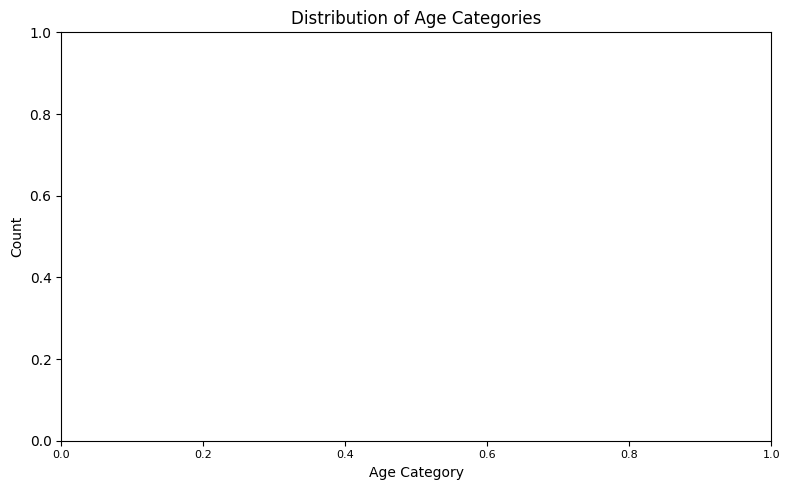

In [9]:
# age
age_eda = df.copy()
age_pk = pd.read_csv('/content/drive/MyDrive/DSA3101 Data/Survey Mapped Primary Keys/Age_mapped.csv')

# count number of instances of each category
age_counts = age_eda['Age'].value_counts().reset_index().sort_values(by='Age')
age_counts.columns = ['a', 'Count']
age_counts_merged = pd.merge(age_pk, age_counts, left_on='Age_ID', right_on='a', how='inner').drop(columns=['a']) # drop duplicate column
age_counts_merged

# get exact percentages
for index, row in age_counts_merged.iterrows():
    age = row['Age']
    count = row['Count']
    percentage = (count / n) * 100
    print(f"{age}: {percentage:.2f}%")

# 19 years old and younger: 9.47%
# 20 - 29 years old: 66.84%
# 30 - 39 years old: 6.84%
# 40 - 49 years old: 7.37%
# 50 years old and above: 9.47%

# visualise
plt.figure(figsize=(8, 5))
sns.barplot(data=age_counts_merged, x='Age', y='Count')
plt.title('Distribution of Age Categories')
plt.xlabel('Age Category')
plt.ylabel('Count')
plt.xticks(fontsize=8)
plt.tight_layout()
plt.show

##### Gender

Male: 26.84%
Female: 73.16%


<function matplotlib.pyplot.show(close=None, block=None)>

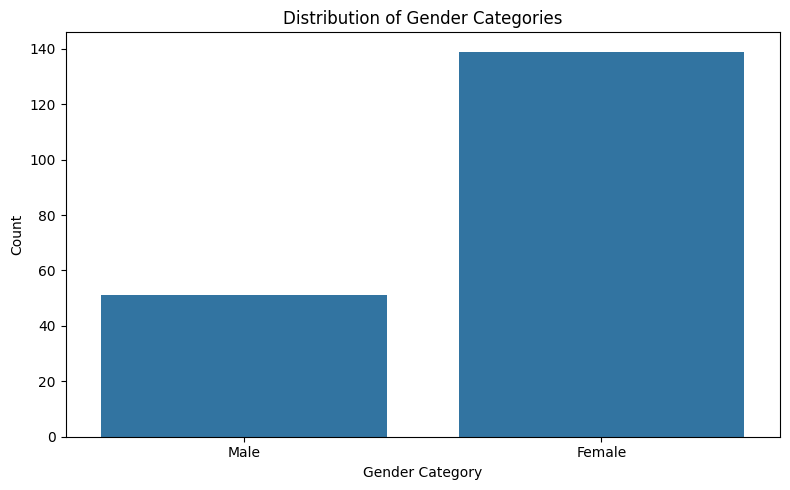

In [10]:
# gender
gender_eda = df.copy()
gender_pk = pd.read_csv('/content/drive/MyDrive/DSA3101 Data/Survey Mapped Primary Keys/Gender_mapped.csv')

# count number of instances of each category
gender_counts = age_eda['Gender'].value_counts().reset_index().sort_values(by='Gender')
gender_counts.columns = ['g', 'Count']
gender_counts_merged = pd.merge(gender_pk, gender_counts, left_on='Gender_ID', right_on='g', how='inner').drop(columns=['g']) # drop duplicate column
gender_counts_merged

# get exact percentages
for index, row in gender_counts_merged.iterrows():
    gender = row['Gender']
    count = row['Count']
    percentage = (count / n) * 100
    print(f"{gender}: {percentage:.2f}%")

# Male: 26.84%
# Female: 73.16%

# visualise
plt.figure(figsize=(8, 5))
sns.barplot(data=gender_counts_merged, x='Gender', y='Count')
plt.title('Distribution of Gender Categories')
plt.xlabel('Gender Category')
plt.ylabel('Count')
plt.tight_layout()
plt.show

##### Tourist/Local

Tourist: 6.84%
Local: 93.16%


<function matplotlib.pyplot.show(close=None, block=None)>

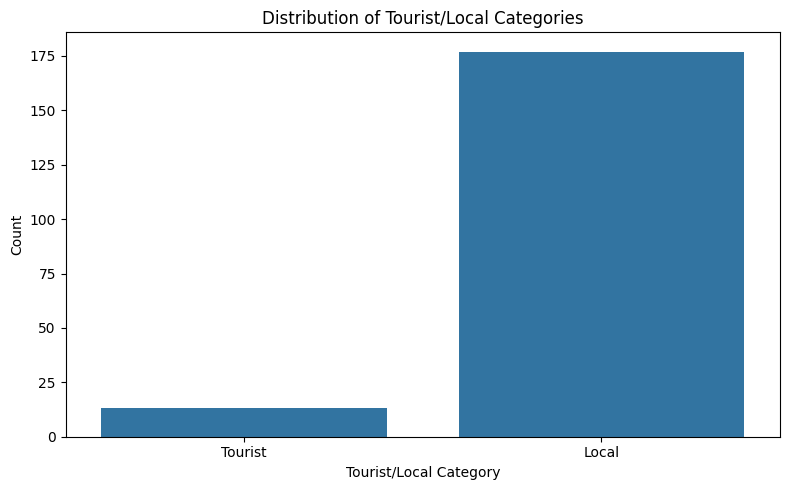

In [11]:
# tourist/local
tl_eda = df.copy()
tl_pk = pd.read_csv('/content/drive/MyDrive/DSA3101 Data/Survey Mapped Primary Keys/Tourist_Local_mapped.csv')

# count number of instances of each category
tl_counts = age_eda['Tourist/Local'].value_counts().reset_index().sort_values(by='Tourist/Local')
tl_counts.columns = ['tl', 'Count']
tl_counts_merged = pd.merge(tl_pk, tl_counts, left_on='Tourist/Local_ID', right_on='tl', how='inner').drop(columns=['tl']) # drop duplicate column
tl_counts_merged

# get exact percentages
for index, row in tl_counts_merged.iterrows():
    gender = row['Tourist/Local']
    count = row['Count']
    percentage = (count / n) * 100
    print(f"{gender}: {percentage:.2f}%")

# Tourist: 6.84%
# Local: 93.16%

# visualise
plt.figure(figsize=(8, 5))
sns.barplot(data=tl_counts_merged, x='Tourist/Local', y='Count')
plt.title('Distribution of Tourist/Local Categories')
plt.xlabel('Tourist/Local Category')
plt.ylabel('Count')
plt.tight_layout()
plt.show

#### 1b. Split data into train and test

We first need to split the data into train and test data to prevent data leakage during the subsequent data synthesis.

In [12]:
# x -> age, gender, tourist/local
x = df2[['Age', 'Gender', 'Tourist/Local']]
# x.head()

# y -> all else
y = df2.iloc[:, 3:]
# y.head()

In [13]:
# split data -> split into 70/30 to ensure that there's enough minority class data due to smaller dataset size
x_train, y_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

#### 2. SVD

We first perform SVD to increase the number of data points we have to prepare the data for SMOTE by increasing the number of minority data we have whilst maintaining the distribution. Since SVD replicates the behaviour of the original data, the synthesised data should have similar behaviour and distributions to the original dataframe.

##### SVD algorithm

In [14]:
# 1. Create a metadata object and detect the properties of your dataframe
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=df2)

# 2. Inspect metadata to ensure correct column types and properties
print("Detected Metadata:")
print(metadata.to_dict())  # This will show the types of your columns

# 3. Optionally modify metadata if necessary (e.g., correct any misclassified columns)
# metadata.update_column(column_name='age', sdtype='numerical')

# 4. Initialize the GaussianCopulaSynthesizer with the metadata
synthesizer = GaussianCopulaSynthesizer(metadata=metadata)

# 5. Fit the synthesizer to your dataframe
synthesizer.fit(df2)

# 6. Sample synthetic data (adjust num_rows as needed)
synthetic_data = synthesizer.sample(num_rows=len(df2))
synthetic_data

# # 7. Show synthetic data
# print(synthetic_data.head())  # Display the first few rows of synthetic data


Detected Metadata:
{'columns': {'Age': {'sdtype': 'categorical'}, 'Gender': {'sdtype': 'categorical'}, 'Tourist/Local': {'sdtype': 'categorical'}, 'USS companion [Children]': {'sdtype': 'categorical'}, 'USS companion [Colleagues]': {'sdtype': 'categorical'}, 'USS companion [Family]': {'sdtype': 'categorical'}, 'USS companion [Friends]': {'sdtype': 'categorical'}, 'USS companion [None]': {'sdtype': 'categorical'}, 'USS companion [Significant other]': {'sdtype': 'categorical'}, 'Visiting frequency': {'sdtype': 'categorical'}, 'Visiting occasion [Free tickets]': {'sdtype': 'categorical'}, 'Visiting occasion [Public holiday]': {'sdtype': 'categorical'}, 'Visiting occasion [School holiday]': {'sdtype': 'categorical'}, 'Visiting occasion [School/work event]': {'sdtype': 'categorical'}, 'Visiting occasion [Special events]': {'sdtype': 'categorical'}, 'Visiting occasion [Special occasion]': {'sdtype': 'categorical'}, 'Visiting occasion [Weekdays]': {'sdtype': 'categorical'}, 'Visiting occasion

/usr/local/lib/python3.10/dist-packages/sdv/single_table/base.py:120: FutureWarning: The 'SingleTableMetadata' is deprecated. Please use the new 'Metadata' class for synthesizers.
  warnings.warn(DEPRECATION_MSG, FutureWarning)
/usr/local/lib/python3.10/dist-packages/sdv/single_table/base.py:105: UserWarning: We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.
  warnings.warn(


,Age,Gender,Tourist/Local,USS companion [Children],USS companion [Colleagues],USS companion [Family],USS companion [Friends],USS companion [None],USS companion [Significant other],Visiting frequency,Visiting occasion [Free tickets],Visiting occasion [Public holiday],Visiting occasion [School holiday],Visiting occasion [School/work event],Visiting occasion [Special events],Visiting occasion [Special occasion],Visiting occasion [Weekdays],Visiting occasion [Weekends],Attractive factors [Food options],Attractive factors [Types of rides available],Attractive factors [Gift shops],Attractive factors [Special events (e.g. Halloween Horror Night)],Attractive factors [Accessibility],Seasonal pass [Frequent visitor to USS],Seasonal pass [Bundle price],Seasonal pass [Eligibility during a holiday period],Time enter,Time leave,Rating experience,Improve experience [Short wait times],Improve experience [Lack of crowds],Improve experience [Fun attractions],Improve experience [Affordable food options],"Improve experience [Accessibility (Ramps, even ground, easy to find seats etc)]",Improve experience [Cooling Weather],Improve experience [Presence of Shaded Rest Areas],Improve experience [Usability of the Universal Studios Singapore App],Worsen experience [Long wait time],Worsen experience [Crowds],Worsen experience [Attractions not being fun enough],Worsen experience [Expensive food options],"Worsen experience [Inaccessibility (Lack of ramps, Uneven ground, lack of seats etc)]",Worsen experience [Hot weather],Worsen experience [Lack of Shaded Rest Areas],Worsen experience [Usability of the Universal Studios Singapore App],Wet weather [Seek shelter in a restaurant],Wet weather [Go home],Wet weather [Visit indoor attractions],Wet weather [Visit outdoor attractions (I don't mind getting wet)],Wet weather [Visit gift shops/retail areas],Wet weather waiting tolerance,Planning route [Expected wait time],Planning route [Enjoyment of the ride],Planning route [Closeness of ride to current location],Planning route [Prioritisation of Group's Preferences (e.g. going with your family and choosing to go to the rides that your younger siblings prefer)],Attractions busy day [Battlestar Galactica: Human vs. Cylon],Attractions busy day [Transformers The Ride: The Ultimate 3D Battle],Attractions busy day [Revenge of the Mummy],Attractions busy day [Jurassic Park Rapids Adventure],Attractions busy day [Sesame Street Spaghetti Space Chase],Attractions busy day [Canopy Flyer],Attractions busy day [Puss In Boots' Giant Journey],Attractions busy day [Dino-Soarin'],Attractions busy day [Enchanted Airways],Attractions busy day [Treasure Hunters (Vintage Car Attraction)],Attractions busy day [Accelerator (Spinning Ride)],Attractions busy day [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions busy day [Lights, Camera, Action!]",Attractions busy day [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions busy day [Shrek 4-D Adventure],Attractions busy day [Donkey Live],Attractions busy day [Rhythm Truck 2.0],Attractions busy day [WaterWorld],Ride waiting tolerance,Attractions waiting [Battlestar Galactica: Human vs. Cylon],Attractions waiting [Transformers The Ride: The Ultimate 3D Battle],Attractions waiting [Revenge of the Mummy],Attractions waiting [Jurassic Park Rapids Adventure],Attractions waiting [Sesame Street Spaghetti Space Chase],Attractions waiting [Canopy Flyer],Attractions waiting [Puss In Boots' Giant Journey],Attractions waiting [Dino-Soarin'],Attractions waiting [Enchanted Airways],Attractions waiting [Treasure Hunters (Vintage Car Attraction)],Attractions waiting [Accelerator (Spinning Ride)],Attractions waiting [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions waiting [Lights, Camera, Action!]",Attractions waiting [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions waiting [Shrek 4-D Adventure],Attractions waiting [Donkey Live],Attractions 

##### Evaluate distribution of the synthesised data

In [15]:
def compare_summary_statistics(real_data, synthetic_data):
    """
    Compare summary statistics (mean, median, standard deviation) between real and synthetic data.

    Parameters:
    - real_data: Real dataset (pandas DataFrame)
    - synthetic_data: Synthetic dataset (pandas DataFrame)
    """
    stats_real = real_data.describe().T[['mean', '50%', 'std']]
    stats_synthetic = synthetic_data.describe().T[['mean', '50%', 'std']]

    comparison = pd.concat([stats_real, stats_synthetic], axis=1, keys=['Real', 'Synthetic'])
    print(comparison)

# Example usage
compare_summary_statistics(df2, synthetic_data)

                                                        Real                 \
                                                        mean  50%       std   
Age                                                 0.000000  0.0  0.000000   
Gender                                              1.731579  2.0  0.444309   
Tourist/Local                                       1.931579  2.0  0.253134   
USS companion [Children]                            0.089474  0.0  0.286180   
USS companion [Colleagues]                          0.005263  0.0  0.072548   
USS companion [Family]                              0.557895  1.0  0.497949   
USS companion [Friends]                             0.742105  1.0  0.438632   
USS companion [None]                                0.005263  0.0  0.072548   
USS companion [Significant other]                   0.189474  0.0  0.392920   
Visiting frequency                                  0.000000  0.0  0.000000   
Visiting occasion [Free tickets]                    

In [16]:
def compare_summary_statistics(real_data, synthetic_data, threshold):
    """
    Compare summary statistics (mean, median, standard deviation) between real and synthetic data.
    Calculate percentage differences and flag significant discrepancies.

    Parameters:
    - real_data: Real dataset (pandas DataFrame)
    - synthetic_data: Synthetic dataset (pandas DataFrame)
    - threshold (float): The percentage difference threshold to flag large deviations (default is 5%).

    Returns:
    - comparison (pd.DataFrame): DataFrame containing the statistics and percentage differences.
    - significant_diff (pd.DataFrame): DataFrame containing columns with significant deviations.
    """
    # Calculate summary statistics for real and synthetic data
    stats_real = real_data.describe().T[['mean', '50%', 'std']].rename(columns={'50%': 'median'})
    stats_synthetic = synthetic_data.describe().T[['mean', '50%', 'std']].rename(columns={'50%': 'median'})

    # Combine both into one DataFrame for easy comparison
    comparison = pd.concat([stats_real, stats_synthetic], axis=1, keys=['Real', 'Synthetic'])

    # Calculate percentage differences for mean, median, and standard deviation
    for stat in ['mean', 'median', 'std']:
        comparison[('Difference', stat)] = (comparison[('Synthetic', stat)] - comparison[('Real', stat)]) / comparison[('Real', stat)] * 100

    # Flag significant differences based on the threshold
    significant_diff = comparison[comparison[('Difference', 'mean')].abs() > threshold]

    # Output the results
    # print(f"Summary statistics comparison (threshold: {threshold}%):")
    # print(comparison)

    if not significant_diff.empty:
        print(f"\nColumns with significant differences (more than {threshold}%):")
        print(significant_diff)
    else:
        print("\nNo significant differences found.")

    return comparison, significant_diff

# Example usage:
comparison, significant_diff = compare_summary_statistics(df2, synthetic_data, 10.0)
significant_diff


Columns with significant differences (more than 10.0%):
                                                        Real                   \
                                                        mean median       std   
USS companion [Colleagues]                          0.005263    0.0  0.072548   
USS companion [Family]                              0.557895    1.0  0.497949   
USS companion [None]                                0.005263    0.0  0.072548   
Visiting occasion [Free tickets]                    0.010526    0.0  0.102326   
Visiting occasion [Public holiday]                  0.236842    0.0  0.426268   
Visiting occasion [School/work event]               0.121053    0.0  0.327050   
Visiting occasion [Special events]                  0.510526    1.0  0.501210   
Visiting occasion [Weekdays]                        0.231579    0.0  0.422956   
Visiting occasion [Weekends]                        0.242105    0.0  0.429489   
Ticket purchase avenues [Other Websites]            

Real                   \
                                                        mean median       std   
USS companion [Colleagues]                          0.005263    0.0  0.072548   
USS companion [Family]                              0.557895    1.0  0.497949   
USS companion [None]                                0.005263    0.0  0.072548   
Visiting occasion [Free tickets]                    0.010526    0.0  0.102326   
Visiting occasion [Public holiday]                  0.236842    0.0  0.426268   
Visiting occasion [School/work event]               0.121053    0.0  0.327050   
Visiting occasion [Special events]                  0.510526    1.0  0.501210   
Visiting occasion [Weekdays]                        0.231579    0.0  0.422956   
Visiting occasion [Weekends]                        0.242105    0.0  0.429489   
Ticket purchase avenues [Other Websites]            0.115789    0.0  0.320818   
Ticket purchase avenues [Resalers]                  0.136842    0.0  0.344589   
Ticket purchase avenues [USS Physical Ticket Co...  0.426316    0.0  0.495847   

                                                   Synthetic                   \
                                                        mean median       std   
USS companion [Colleagues]                          0.000000    0.0  0.000000   
USS companion [Family]                              0.447368    0.0  0.498536   
USS companion [None]                                0.010526    0.0  0.102326   
Visiting occasion [Free tickets]                    0.015789    0.0  0.124990   
Visiting occasion [Public holiday]                  0.263158    0.0  0.441511   
Visiting occasion [School/work event]               0.078947    0.0  0.270369   
Visiting occasion [Special events]                  0.615789    1.0  0.487693   
Visiting occasion [Weekdays]                        0.315789    0.0  0.466058   
Visiting occasion [Weekends]                        0.215789    0.0  0.412456   
Ticket purchase avenues [Other Websites]            0.100000    0.0  0.300793   
Ticket purchase avenues [Resalers]                  0.168421    0.0  0.375229   
Ticket purchase avenues [USS Physical Ticket Co...  0.521053    1.0  0.500876   

                                                    Difference         \
                                                          mean median   
USS companion [Colleagues]                         -100.000000    NaN   
USS companion [Family]                              -19.811321 -100.0   
USS companion [None]                                100.000000    NaN   
Visiting occasion [Free tickets]                     50.000000    NaN   
Visiting occasion [Public holiday]                   11.111111    NaN   
Visiting occasion [School/work event]               -34.782609    NaN   
Visiting occasion [Special events]                   20.618557    0.0   
Visiting occasion [Weekdays]                         36.363636    NaN   
Visiting occasion [Weekends]                        -10.869565    NaN   
Ticket purchase avenues [Other Websites]            -13.636364    NaN   
Ticket purchase avenues [Resalers]                   23.076923    NaN   
Ticket purchase avenues [USS Physical Ticket Co...   22.222222    inf   

                                                                
                                                           std  
USS companion [Colleagues]                         -100.000000  
USS companion [Family]                                0.117855  
USS companion [None]                                 41.046729  
Visiting occasion [Free tickets]                     22.148323  
Visiting occasion [Public holiday]                    3.575911  
Visiting occasion [School/work event]               -17.331035  
Visiting occasion [Special events]                   -2.696823  
Visiting occasion [Weekdays]                         10.190597  
Visiting occasion [Weekends]                         -3.966026  
Ticket purchase avenues [Other Websites]        

##### Add synthesised data to the original data

In [17]:
merged_df = pd.concat([df2, synthetic_data], ignore_index=True)
merged_df

,Age,Gender,Tourist/Local,USS companion [Children],USS companion [Colleagues],USS companion [Family],USS companion [Friends],USS companion [None],USS companion [Significant other],Visiting frequency,Visiting occasion [Free tickets],Visiting occasion [Public holiday],Visiting occasion [School holiday],Visiting occasion [School/work event],Visiting occasion [Special events],Visiting occasion [Special occasion],Visiting occasion [Weekdays],Visiting occasion [Weekends],Attractive factors [Food options],Attractive factors [Types of rides available],Attractive factors [Gift shops],Attractive factors [Special events (e.g. Halloween Horror Night)],Attractive factors [Accessibility],Seasonal pass [Frequent visitor to USS],Seasonal pass [Bundle price],Seasonal pass [Eligibility during a holiday period],Time enter,Time leave,Rating experience,Improve experience [Short wait times],Improve experience [Lack of crowds],Improve experience [Fun attractions],Improve experience [Affordable food options],"Improve experience [Accessibility (Ramps, even ground, easy to find seats etc)]",Improve experience [Cooling Weather],Improve experience [Presence of Shaded Rest Areas],Improve experience [Usability of the Universal Studios Singapore App],Worsen experience [Long wait time],Worsen experience [Crowds],Worsen experience [Attractions not being fun enough],Worsen experience [Expensive food options],"Worsen experience [Inaccessibility (Lack of ramps, Uneven ground, lack of seats etc)]",Worsen experience [Hot weather],Worsen experience [Lack of Shaded Rest Areas],Worsen experience [Usability of the Universal Studios Singapore App],Wet weather [Seek shelter in a restaurant],Wet weather [Go home],Wet weather [Visit indoor attractions],Wet weather [Visit outdoor attractions (I don't mind getting wet)],Wet weather [Visit gift shops/retail areas],Wet weather waiting tolerance,Planning route [Expected wait time],Planning route [Enjoyment of the ride],Planning route [Closeness of ride to current location],Planning route [Prioritisation of Group's Preferences (e.g. going with your family and choosing to go to the rides that your younger siblings prefer)],Attractions busy day [Battlestar Galactica: Human vs. Cylon],Attractions busy day [Transformers The Ride: The Ultimate 3D Battle],Attractions busy day [Revenge of the Mummy],Attractions busy day [Jurassic Park Rapids Adventure],Attractions busy day [Sesame Street Spaghetti Space Chase],Attractions busy day [Canopy Flyer],Attractions busy day [Puss In Boots' Giant Journey],Attractions busy day [Dino-Soarin'],Attractions busy day [Enchanted Airways],Attractions busy day [Treasure Hunters (Vintage Car Attraction)],Attractions busy day [Accelerator (Spinning Ride)],Attractions busy day [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions busy day [Lights, Camera, Action!]",Attractions busy day [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions busy day [Shrek 4-D Adventure],Attractions busy day [Donkey Live],Attractions busy day [Rhythm Truck 2.0],Attractions busy day [WaterWorld],Ride waiting tolerance,Attractions waiting [Battlestar Galactica: Human vs. Cylon],Attractions waiting [Transformers The Ride: The Ultimate 3D Battle],Attractions waiting [Revenge of the Mummy],Attractions waiting [Jurassic Park Rapids Adventure],Attractions waiting [Sesame Street Spaghetti Space Chase],Attractions waiting [Canopy Flyer],Attractions waiting [Puss In Boots' Giant Journey],Attractions waiting [Dino-Soarin'],Attractions waiting [Enchanted Airways],Attractions waiting [Treasure Hunters (Vintage Car Attraction)],Attractions waiting [Accelerator (Spinning Ride)],Attractions waiting [Magic Potion Spin (Far Far Away Ferris Wheel)],"Attractions waiting [Lights, Camera, Action!]",Attractions waiting [The Dance for the Magic Beans (Interactive show with Puss in Boots and Kitty Softpaws)],Attractions waiting [Shrek 4-D Adventure],Attractions waiting [Donkey Live],Attractions 

#### 3. SMOTE

We address the imbalanced data by first using oversampling to synthesise data. We will also use the number of data that falls under certain demographics of people to guide our subsequent data synthesis using domain knowledge.

In [18]:
def balance_distributions_with_smote(df, target_columns):
    balanced_df = df.copy()  # Start with a copy of the original DataFrame
    for col in target_columns:
        print(f"Original distribution for column: {col}")
        print(balanced_df[col].value_counts(normalize=True) * 100)
        print("\n" + "-" * 40 + "\n")

        # Prepare data for resampling
        X = balanced_df.drop(columns=[col])
        y = balanced_df[col]

        # Initialize SMOTE
        smote = SMOTE(random_state=42)

        # Apply SMOTE
        X_resampled, y_resampled = smote.fit_resample(X, y)

        # Create a new DataFrame for the resampled data
        resampled_df = pd.DataFrame(X_resampled, columns=X.columns)

        # Concatenate the target column with the resampled features
        resampled_df[col] = y_resampled

        # Concatenate original and resampled DataFrames
        balanced_df = pd.concat([balanced_df, resampled_df], ignore_index=True)

        # Reset index after concatenation to ensure it's clean
        balanced_df.reset_index(drop=True, inplace=True)

        # Print new distribution
        print(f"New distribution for column: {col}")
        print(balanced_df[col].value_counts(normalize=True) * 100)
        print("\n" + "-" * 40 + "\n")

    return balanced_df

# Specify the categorical columns you want to balance
target_columns = ['Age', 'Gender', 'Tourist/Local']

# Call the function to balance distributions using SMOTE
balanced_df = balance_distributions_with_smote(merged_df, target_columns)
balanced_df

Original distribution for column: Age
Age
0    100.0
Name: proportion, dtype: float64

----------------------------------------



ValueError: The target 'y' needs to have more than 1 class. Got 1 class instead

In [ ]:
def print_category_distributions(df):
    # Iterate over each column in the DataFrame
    for col in df.columns:
        if pd.api.types.is_integer_dtype(df[col]):  # Include integer-based categorical columns
            print(f"Distribution for column: {col}")
            print(df[col].value_counts(normalize=True) * 100)  # Normalize for percentage
            print("\n" + "-"*40 + "\n")

# Example usage with your DataFrame
print_category_distributions(balanced_df)

#### 4. Add back Survey_ID column and open-ended questions

In [ ]:
df_syn = balanced_df.copy()
df_syn = df_syn.iloc[len(df2) : , :] # return synthesised data
df_orig = df2.copy() # original data

# add open-ended qns back to df_orig (add to end)
df_orig = pd.concat([df_orig, df['Suggestions for improving USS experience'], df['Suggestions for improving USS website']], axis = 1)
# df_orig.head()

# add rows on 'nil' for open-ended questions in df_syn (add to end)
df_syn['Suggestions for improving USS experience'] = 'nil'
df_syn['Suggestions for improving USS website'] = 'nil'
df_syn.head()

# merge original and synthesised data together
df3 = pd.concat([df_orig, df_syn], ignore_index=True)

# add Survey_ID back
df3['Survey_ID'] = range(1, len(df3) + 1)
df3.insert(0, 'Survey_ID', df3.pop('Survey_ID'))

df3.head(5)


### Export final cleaned excel file (csv, xlsx)

In [ ]:
## cleaned balanced survey data ##

# export as csv
csv_file_name = "Survey_cleaned_balanced.csv"
csv_folder_path = '/content/drive/MyDrive/DSA3101 Data/Processed Data/'

df3.to_csv(csv_folder_path + csv_file_name, index=False)  # exclude index
print(f"Exported df3 to {csv_folder_path + csv_file_name}")

# export as xlsx
excel_file_name = "Survey_cleaned_balanced.xlsx"
excel_folder_path = '/content/drive/MyDrive/DSA3101 Data/Processed Data/'

df3.to_excel(excel_folder_path + excel_file_name, index=False)  # exclude index
print(f"Exported df3 to {excel_folder_path + excel_file_name}")
